In [1]:
import tensorflow as tf
import numpy as np
import glob
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from deeplab import DeepLabV3Plus
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, LearningRateScheduler
%matplotlib inline

2024-03-10 14:05:47.990900: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-10 14:05:49.005491: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
img = glob.glob('./images/train/*/*.png')
label = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img]

index = np.random.permutation(len(img))
img = np.array(img)[index]
label = np.array(label)[index]

img_val = glob.glob('./images/val/*/*.png')
label_val = [path.replace('images', 'gtFine').replace('_leftImg8bit.png', '_gtFine_labelTrainIds.png') for path in img_val]

train_count = len(label)
val_count = len(label_val)

dataset_train = tf.data.Dataset.from_tensor_slices((img, label))
dataset_val = tf.data.Dataset.from_tensor_slices((img_val, label_val))

2024-03-10 14:05:50.597152: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-10 14:05:50.606492: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-10 14:05:50.606819: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

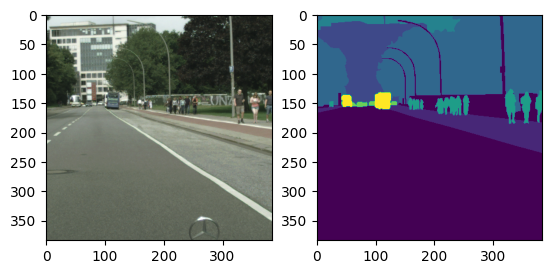

In [3]:
def read_png(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    return img

def read_png_label(path):
    with tf.device('/cpu:0'): 
        img = tf.io.read_file(path)
        img = tf.image.decode_png(img, channels=1)
        img = tf.where(img == 255, tf.zeros_like(img), img)
    return img

def crop_img(img, mask):

    # 确保float32类型
    img_uint8 = tf.cast(img, tf.uint8)

    concat_img = tf.concat([img_uint8, mask], axis=-1)
    concat_img = tf.image.resize(concat_img, (512, 1024), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    crop_img = tf.image.random_crop(concat_img, [384, 384, tf.shape(concat_img)[-1]])

    # 将裁剪后的图像和掩码分离，并将掩码转换回原始数据类型
    return crop_img[:, :, :3], tf.cast(crop_img[:, :, 3:], mask.dtype)



img_1 = read_png(img[0])
label_1 = read_png_label(label[0])
concat_img = tf.concat([img_1, label_1], axis=-1)
img_1, label_1 = crop_img(img_1, label_1)

plt.subplot(1,2,1)
plt.imshow(img_1.numpy())
plt.subplot(1,2,2)
plt.imshow(np.squeeze(label_1.numpy()))

In [4]:
def normal(img, mask):
    img = tf.cast(img, tf.float32)/127.5 -1
    mask = tf.cast(mask, tf.int32)
    return img, mask

def load_image_train(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    # 现有的色彩增强
    # img = tf.image.random_brightness(img, max_delta=0.5)
    # img = tf.image.random_saturation(img, lower=0.5, upper=1.5)
    # img = tf.image.random_hue(img, max_delta=0.2)
    # img = tf.image.random_contrast(img, lower=0.5, upper=1.5)
    # img = tf.clip_by_value(img, 0, 255)
    
    # 随机缩放
    scale = tf.random.uniform([], 0.7, 2)
    new_height = tf.cast(tf.cast(tf.shape(img)[0], tf.float32) * scale, tf.int32)
    new_width = tf.cast(tf.cast(tf.shape(img)[1], tf.float32) * scale, tf.int32)
    img = tf.image.resize(img, [new_height, new_width])
    mask = tf.image.resize(mask, [new_height, new_width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    img, mask = crop_img(img, mask)
    
    # 随机水平翻转
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
        mask = tf.image.flip_left_right(mask)

    # 随机旋转 [0, 90, 180, 270] 度
    # k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    # img = tf.image.rot90(img, k)
    # mask = tf.image.rot90(mask, k)

    # 标准化
    img, mask = normal(img, mask)

    return img, mask


def load_image_val(img_path, mask_path):
    img = read_png(img_path)
    mask = read_png_label(mask_path)
    
    img, mask = crop_img(img, mask)
        
    img, mask = normal(img, mask)
    
    return img, mask

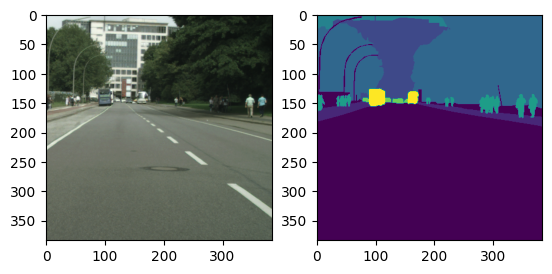

In [5]:
BCTCH_SIZE = 24
BUFFER_SIZE = 128
step_per_epoch = train_count//BCTCH_SIZE
val_step = val_count//BCTCH_SIZE

auto = tf.data.experimental.AUTOTUNE
dataset_train = dataset_train.map(load_image_train, num_parallel_calls=auto)
dataset_val = dataset_val.map(load_image_val, num_parallel_calls=auto)

for i, m in dataset_train.take(1):
    plt.subplot(1,2,1)
    plt.imshow((i.numpy() + 1)/2)
    plt.subplot(1,2,2)
    plt.imshow(np.squeeze(m.numpy()))

dataset_train = dataset_train.shuffle(BUFFER_SIZE).batch(BCTCH_SIZE)
dataset_val = dataset_val.batch(BCTCH_SIZE)

In [6]:
dataset_train

<_BatchDataset element_spec=(TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 384, 384, 1), dtype=tf.int32, name=None))>

In [7]:
model = DeepLabV3Plus(384, 384, 11)

*** Building DeepLabV3Plus Network ***


/home/featurize/data/resnet/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


*** Output_Shape => (None, 384, 384, 11) ***


In [8]:
model.summary()

Model: "DeepLabV3_Plus"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 384, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 390, 390, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1 (Conv2D)              (None, 192, 192, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 bn_conv1 (BatchNormalizati  (None, 192, 192, 64)         256       ['conv1[0][0]']               
 on)                                                                                 

In [9]:
# for layer in model.layers:
#     if isinstance(layer, tf.keras.layers.BatchNormalization):
#         layer.momentum = 0.9997
#     elif isinstance(layer, tf.keras.layers.Conv2D):
#         layer.kernel_regularizer = tf.keras.regularizers.l2(1e-4)
# reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
#     monitor='val_loss', 
#     factor=0.1,         
#     patience=10,         
#     min_lr=0.000001,     
#     verbose=1
# )

In [10]:
class MeanIoU(tf.keras.metrics.MeanIoU):
    def __call__(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.argmax(y_pred, axis=-1)
        return super().__call__(y_true, y_pred, sample_weight=sample_weight)

# optimizer = tf.keras.optimizers.Adam(learning_rate=5e-4)

loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
train_iou = MeanIoU(11, name='train_iou')

test_loss = tf.keras.metrics.Mean(name='test_loss')
test_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='test_accuracy')
test_iou = MeanIoU(11, name='test_iou')

In [11]:
base_learning_rate = 0.01
momentum = 0.9
weight_decay = 0.0001
power = 1.2
total_steps = 12300

# 使用多项式衰减学习率调度
learning_rate_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=base_learning_rate,
    decay_steps=total_steps,
    end_learning_rate=0.0, 
    power=power
)

class SGDW(tf.keras.optimizers.SGD):
    def __init__(self, weight_decay, *args, **kwargs):
        super(SGDW, self).__init__(*args, **kwargs)
        self.weight_decay = weight_decay

    def _resource_apply_dense(self, grad, var, apply_state=None):
        var_dtype = var.dtype.base_dtype
        lr_t = self._decayed_lr(var_dtype)  # handle learning rate decay
        wd = lr_t * self.weight_decay

        var.assign_sub((lr_t * grad) + (wd * var))

optimizer = SGDW(
    weight_decay=weight_decay,
    learning_rate=learning_rate_schedule,
    momentum=momentum
)

In [12]:
def weight_decay_loss(model, weight_decay):
    # 计算所有可训练参数的L2损失
    l2_losses = [tf.nn.l2_loss(t) for t in model.trainable_variables if 'bias' not in t.name]
    # 将所有L2损失相加，并乘以权重衰减系数
    return weight_decay * tf.add_n(l2_losses)

@tf.function
def train_step(images, labels):
    with tf.GradientTape() as tape:
        predictions = model(images, training=True)
        loss = loss_object(labels, predictions)
        # 添加权重衰减损失
        loss += weight_decay_loss(model, weight_decay)
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))

    train_loss(loss)
    train_accuracy(labels, predictions)
    train_iou(labels, predictions)

@tf.function
def test_step(images, labels):
    predictions = model(images)
    t_loss = loss_object(labels, predictions)

    test_loss(t_loss)
    test_accuracy(labels, predictions)
    test_iou(labels, predictions)

EPOCHS = 100

for epoch in range(EPOCHS):
    train_loss.reset_states()
    train_accuracy.reset_states()
    train_iou.reset_states()
    test_loss.reset_states()
    test_accuracy.reset_states()
    test_iou.reset_states()

    for images, labels in dataset_train:
        train_step(images, labels)

    for test_images, test_labels in dataset_val:
        test_step(test_images, test_labels)

    template = 'Epoch {:3d}, Loss: {:.3f}, Accuracy: {:.3f}, \
                IOU: {:.3f}, Test Loss: {:.3f}, \
                Test Accuracy: {:.3f}, Test IOU: {:.3f}'
    print (template.format(epoch+1,
                           train_loss.result(),
                           train_accuracy.result()*100,
                           train_iou.result(),
                           test_loss.result(),
                           test_accuracy.result()*100,
                           test_iou.result() 
                           ))

2024-03-09 05:16:43.966740: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-03-09 05:16:46.095405: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-03-09 05:16:50.874970: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f66205d46a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-09 05:16:50.875023: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-03-09 05:16:50.955810: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-03-09 05:19:02.889935: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.40GiB with freed_by_count=0. The caller

Epoch   1, Loss: 2.371, Accuracy: 81.635,                 IOU: 0.385, Test Loss: 1.689,                 Test Accuracy: 50.723, Test IOU: 0.054
Epoch   2, Loss: 2.155, Accuracy: 87.432,                 IOU: 0.488, Test Loss: 1.888,                 Test Accuracy: 52.147, Test IOU: 0.056
Epoch   3, Loss: 2.112, Accuracy: 88.505,                 IOU: 0.526, Test Loss: 1.722,                 Test Accuracy: 54.627, Test IOU: 0.068
Epoch   4, Loss: 2.086, Accuracy: 89.216,                 IOU: 0.558, Test Loss: 1.417,                 Test Accuracy: 60.967, Test IOU: 0.107
Epoch   5, Loss: 2.073, Accuracy: 89.527,                 IOU: 0.579, Test Loss: 0.917,                 Test Accuracy: 69.470, Test IOU: 0.230
Epoch   6, Loss: 2.048, Accuracy: 90.251,                 IOU: 0.594, Test Loss: 0.584,                 Test Accuracy: 79.318, Test IOU: 0.365
Epoch   7, Loss: 2.034, Accuracy: 90.517,                 IOU: 0.617, Test Loss: 0.445,                 Test Accuracy: 83.960, Test IOU: 0.464

In [13]:
model.save('my_model.h5') 

/environment/miniconda3/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2024-03-10 14:06:26.599040: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2024-03-10 14:06:27.945479: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


1/1 [==============================] - 0s 156ms/step
Mean IoU:  0.74161166
Accuracy:  0.92789274
Precision:  0.9422418
Recall:  0.9601051


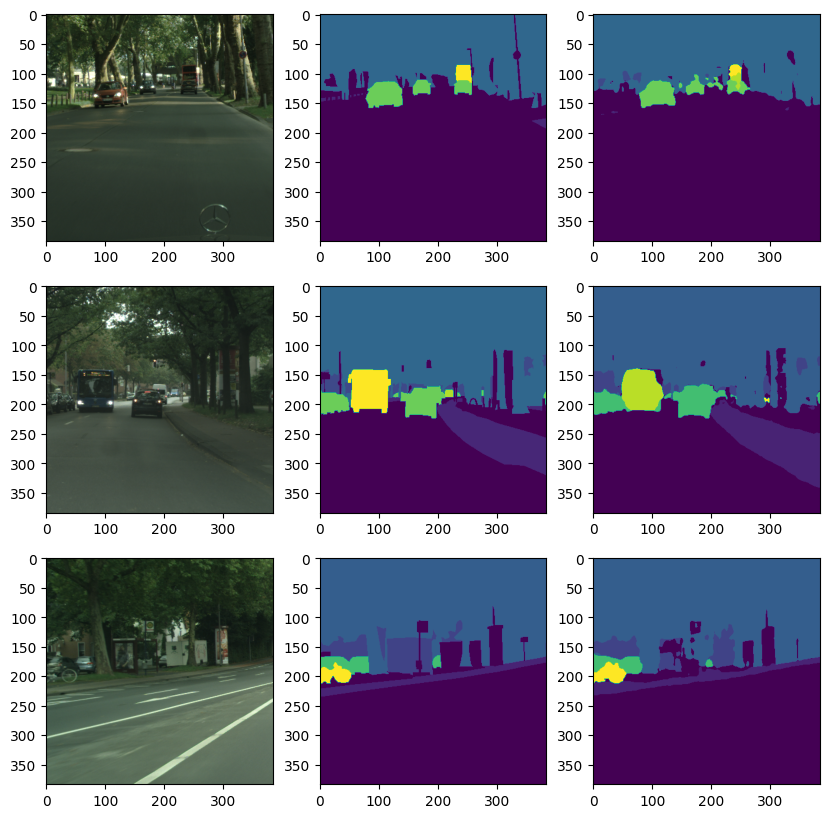

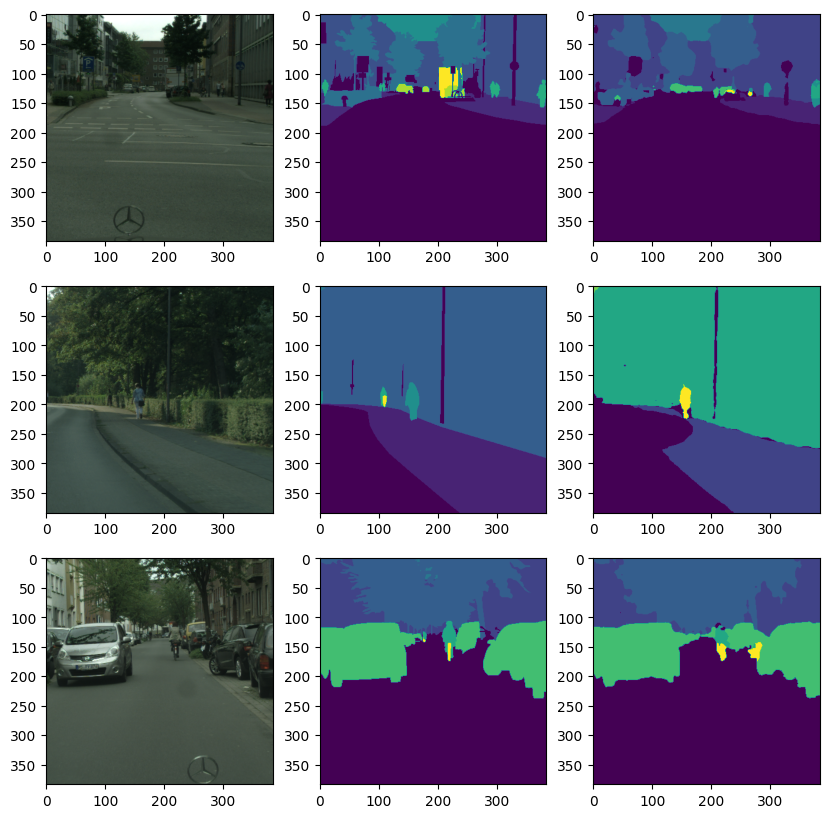

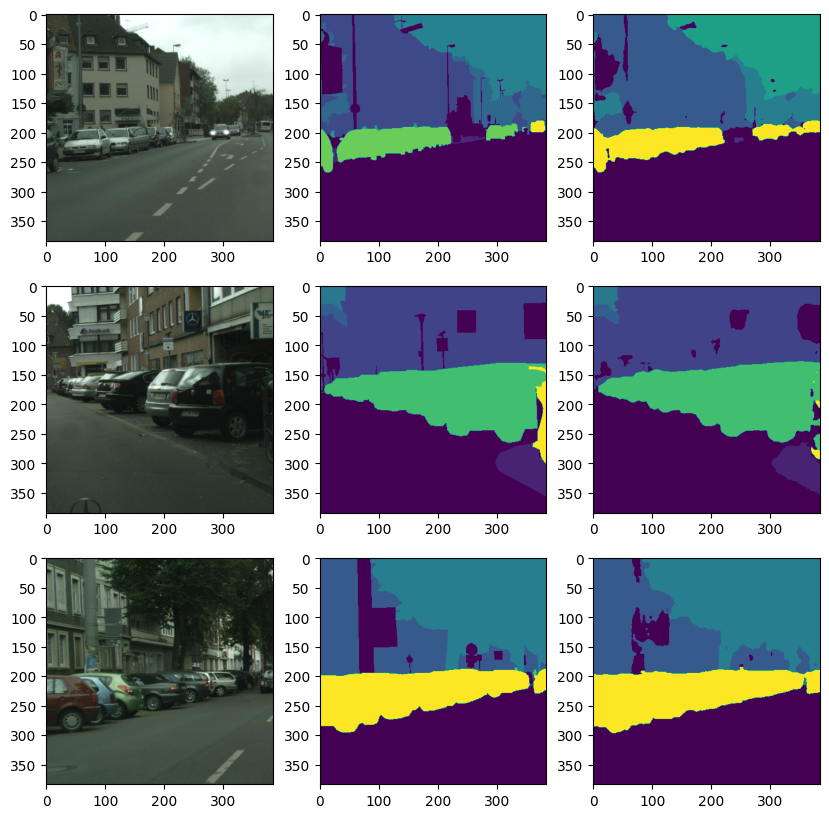

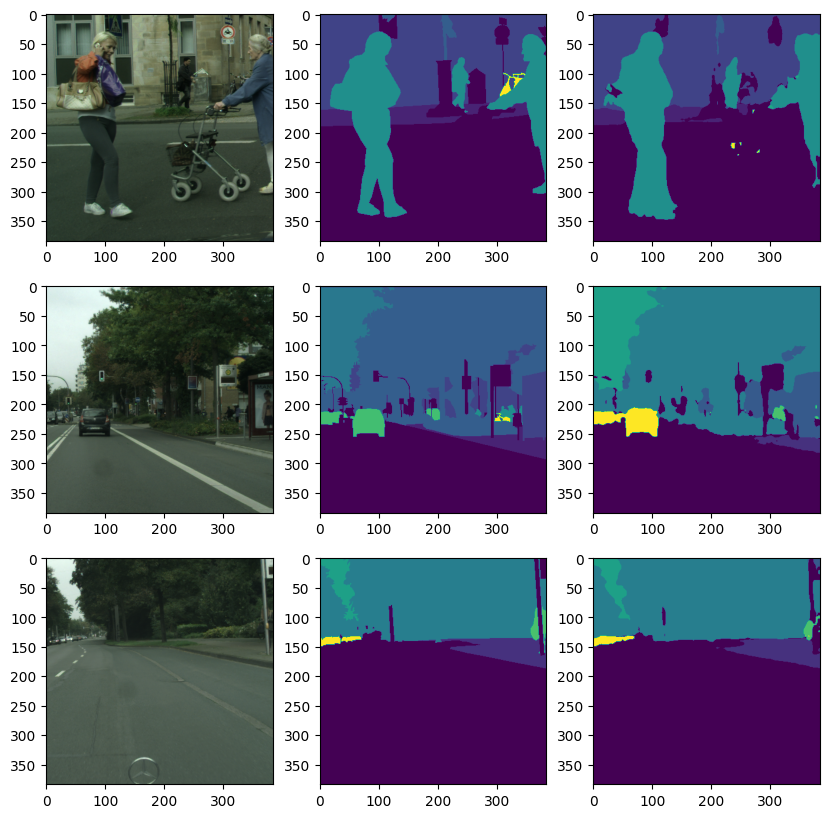

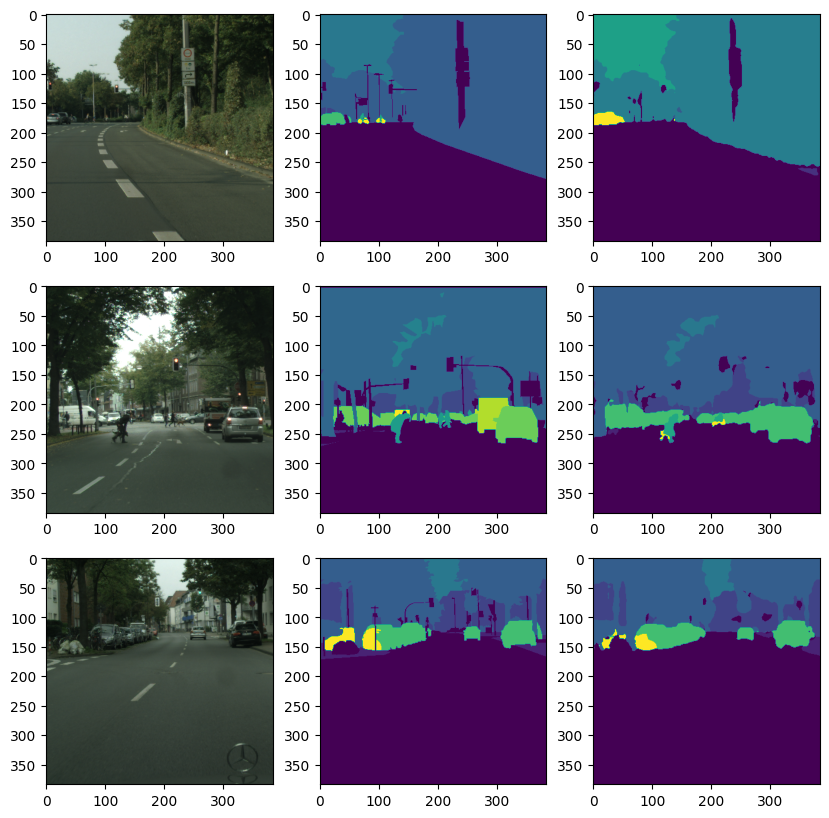

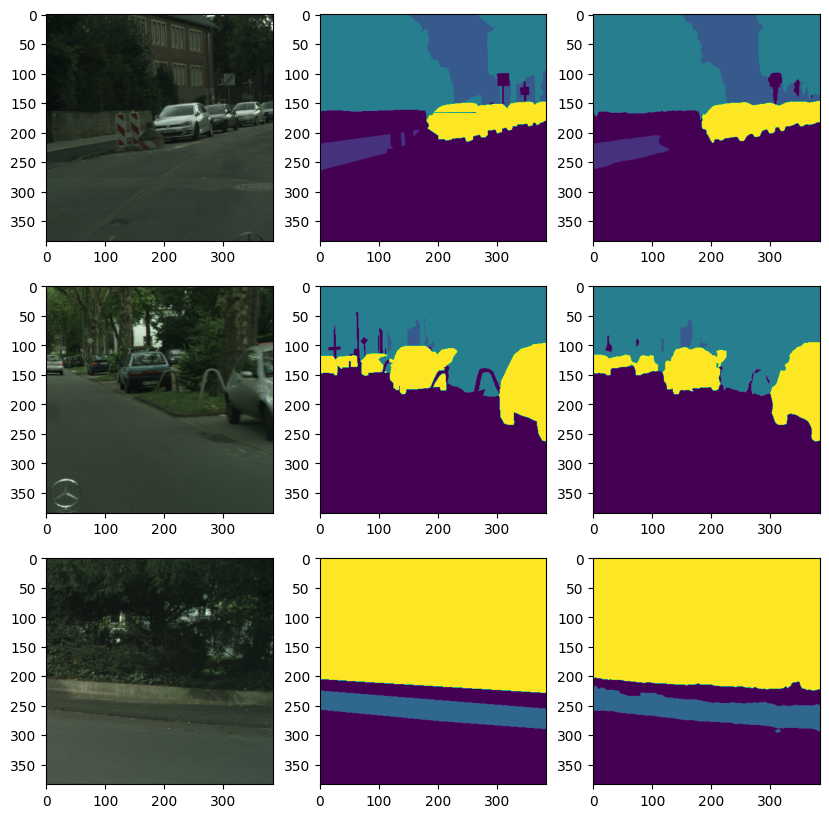

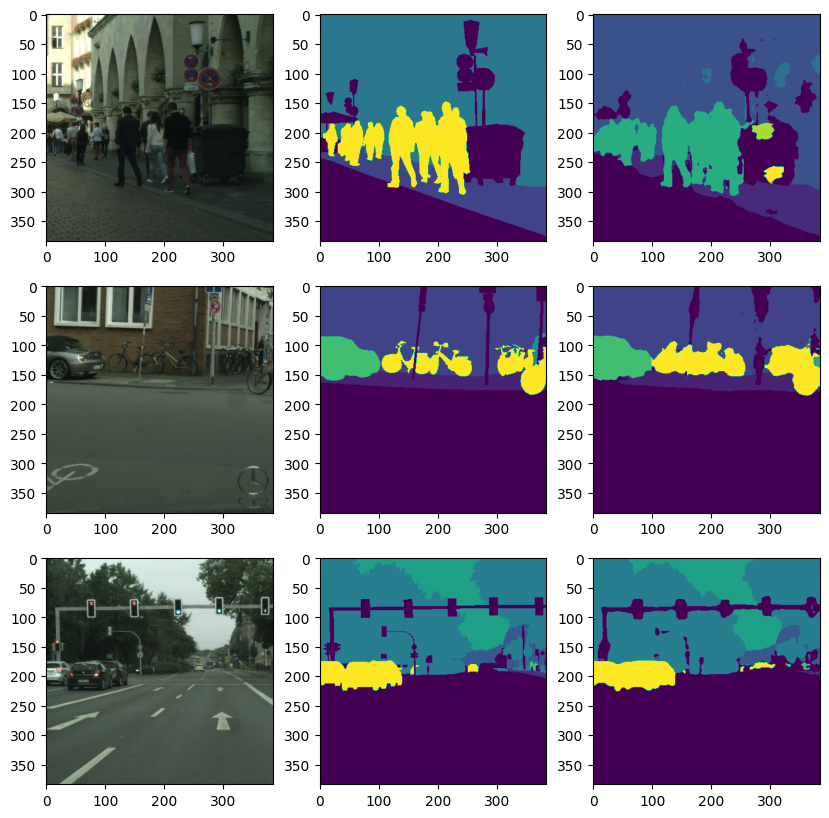

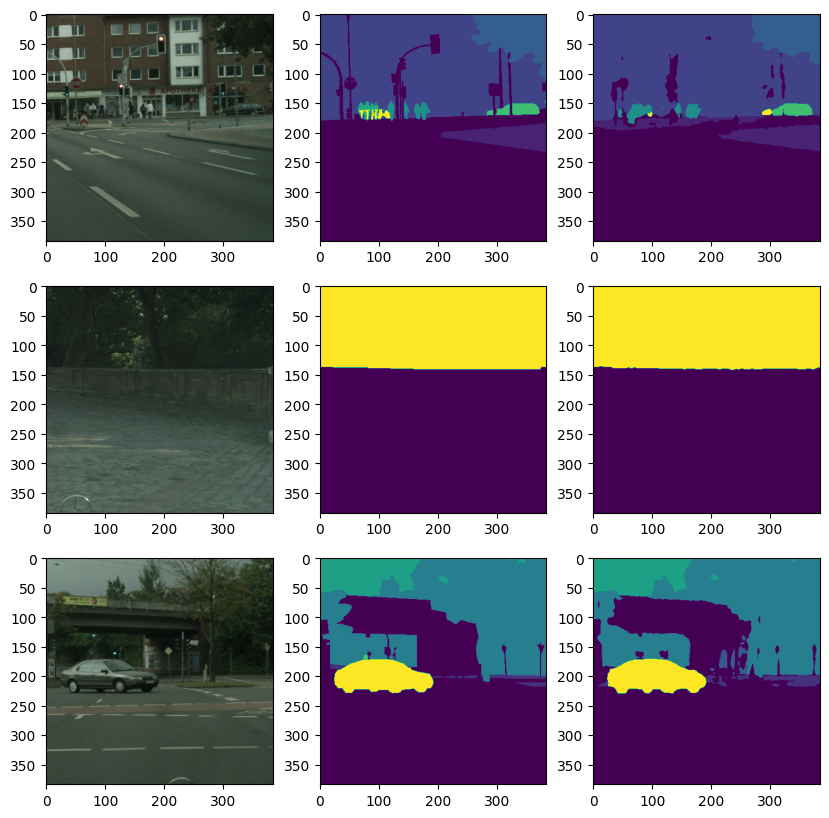

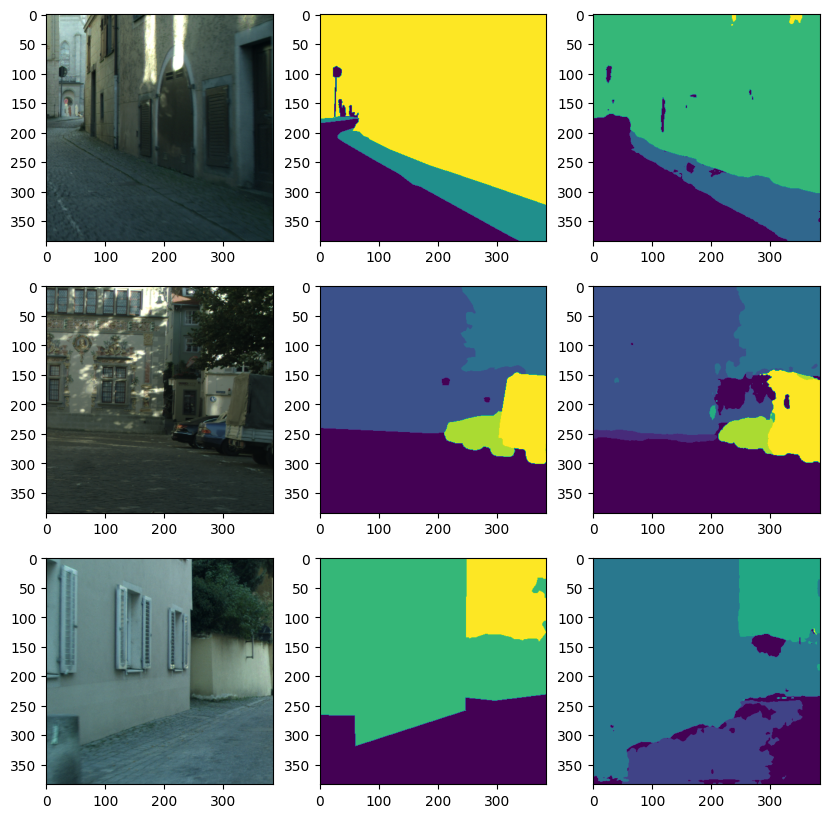

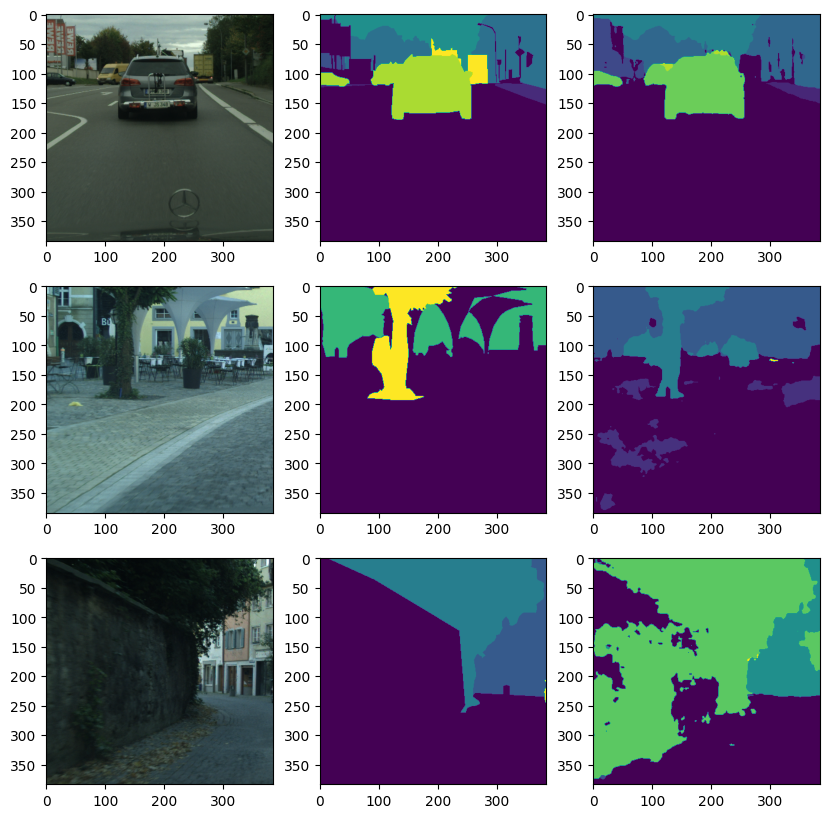

In [8]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=11)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

# model.save_weights('path_to_my_weights.h5')
model.load_weights('path_to_my_weights.h5')

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

    plt.figure(figsize=(10, 10))
    for i in range(num):
        plt.subplot(num, 3, i*num+1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        plt.subplot(num, 3, i*num+2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        plt.subplot(num, 3, i*num+3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

1/1 [==============================] - 0s 135ms/step
Mean IoU:  0.7579205
Accuracy:  0.93768567
Precision:  0.9504441
Recall:  0.9668608


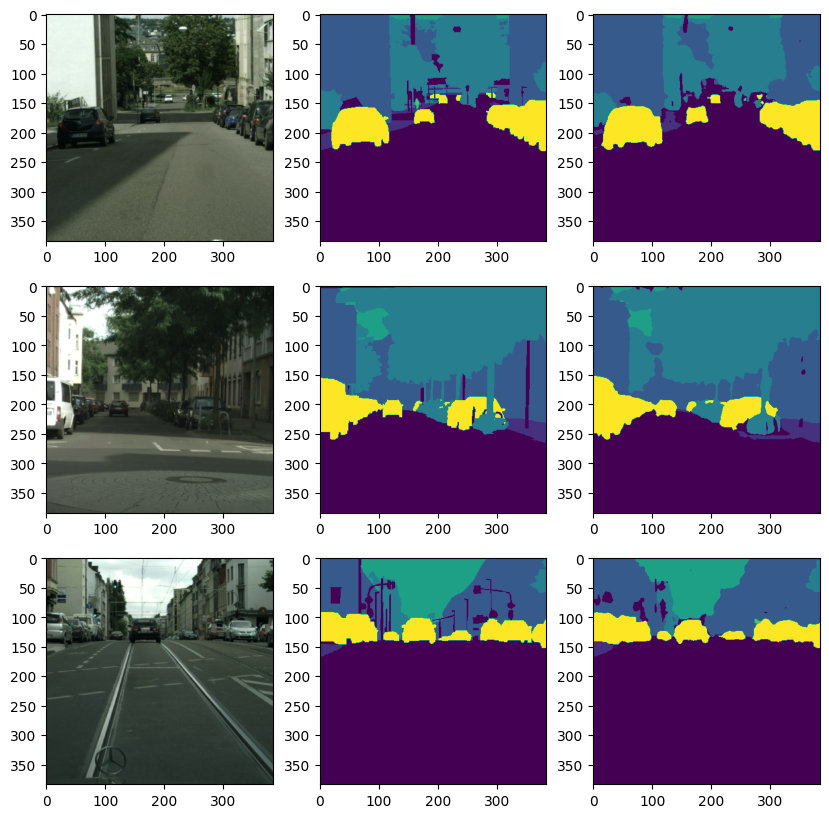

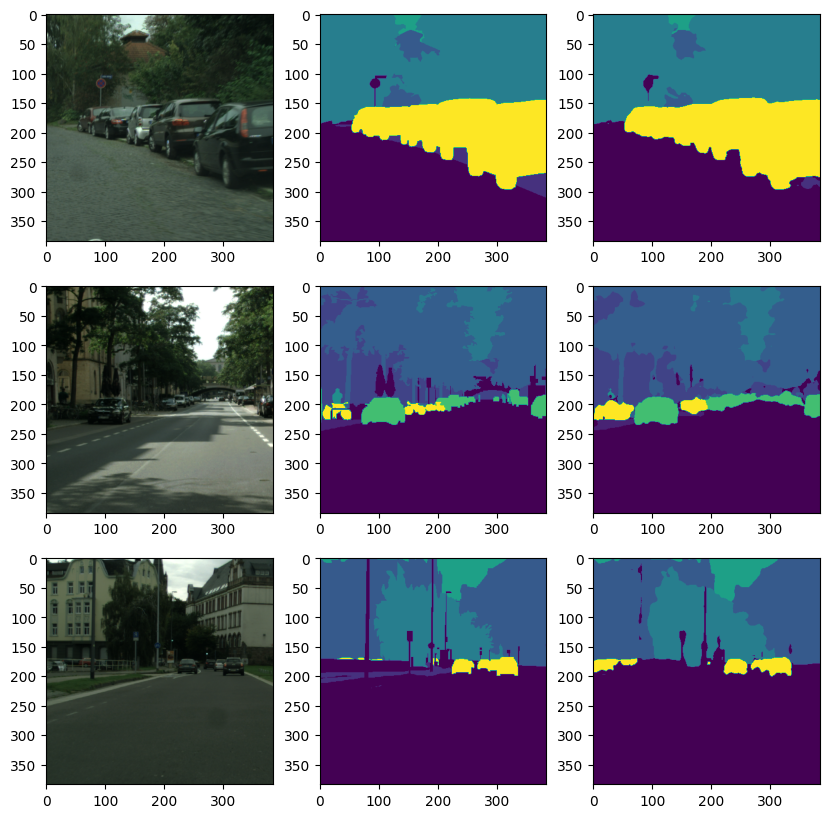

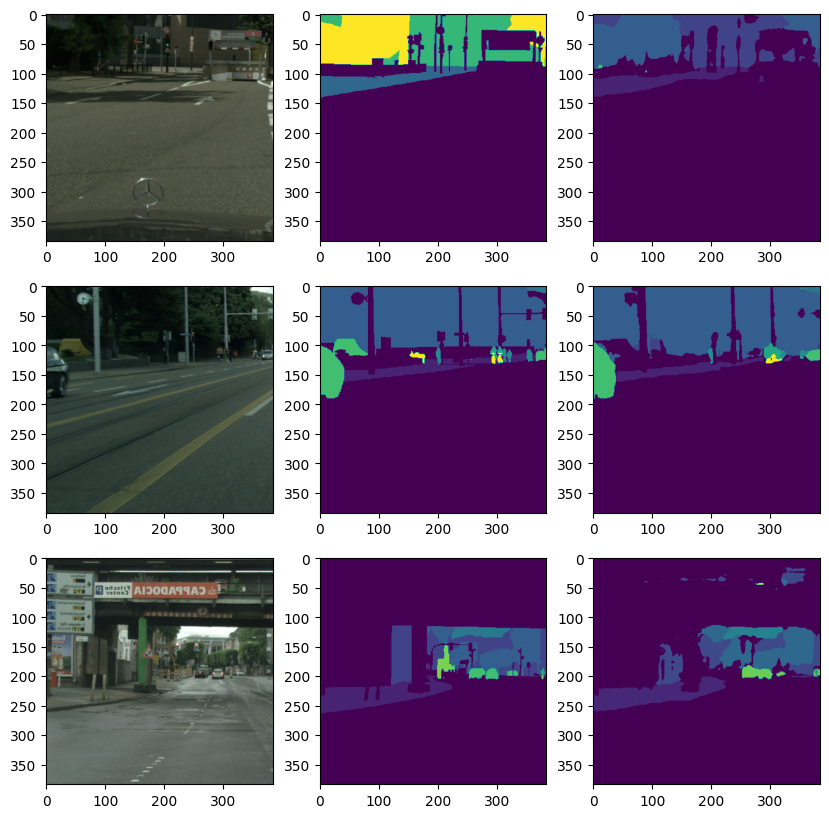

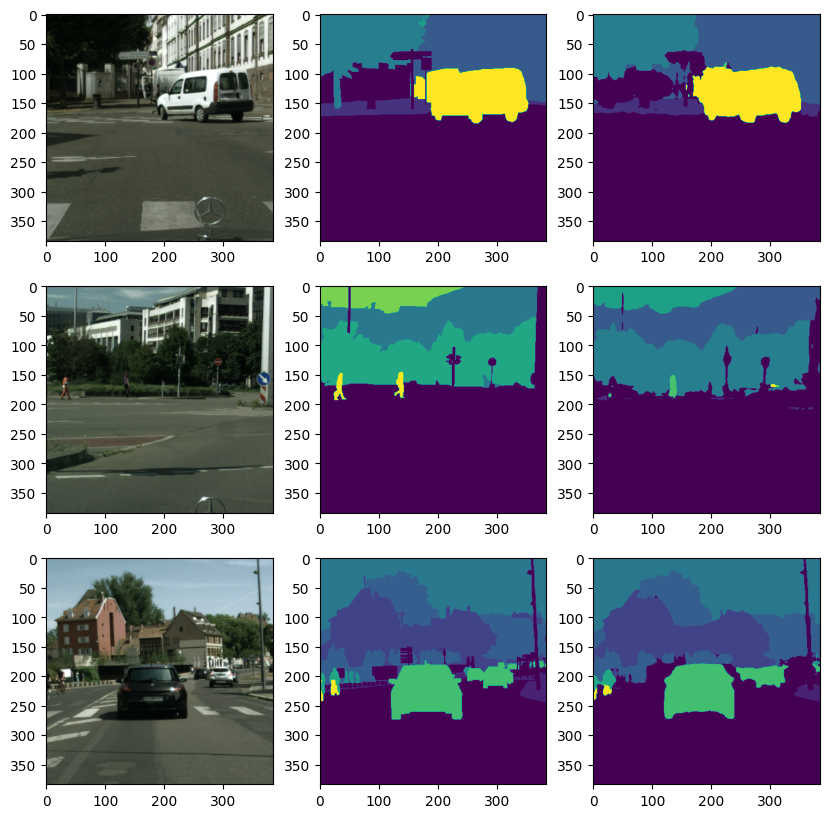

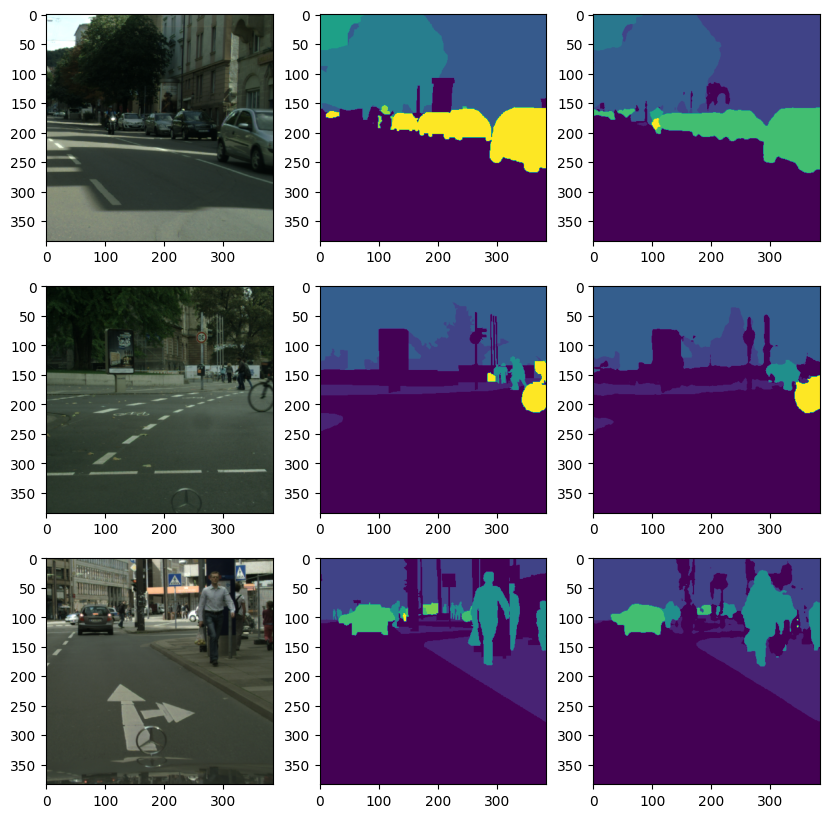

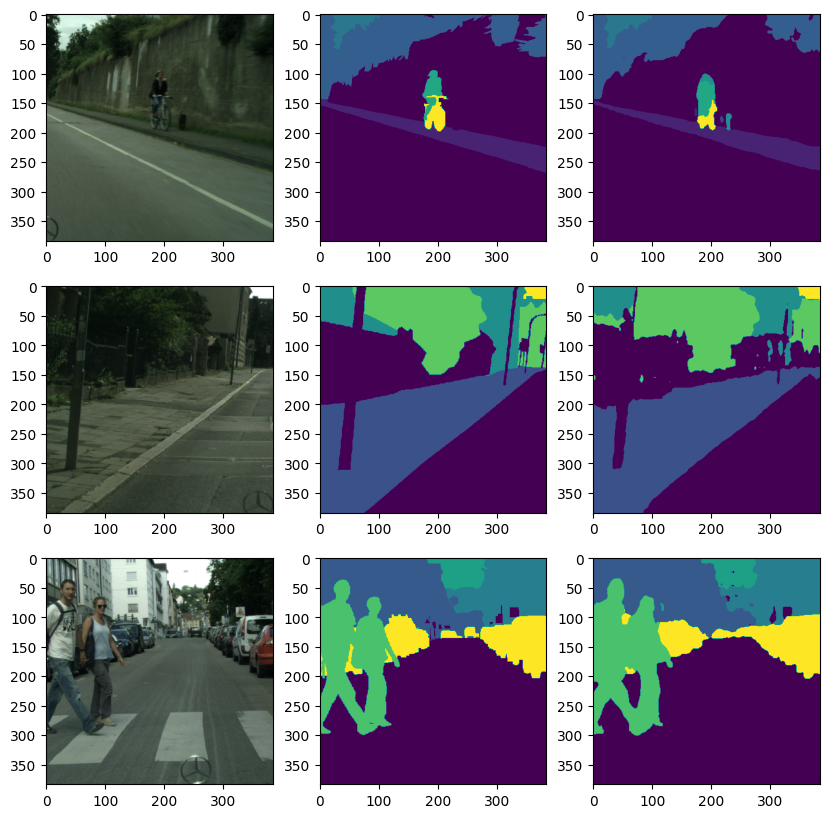

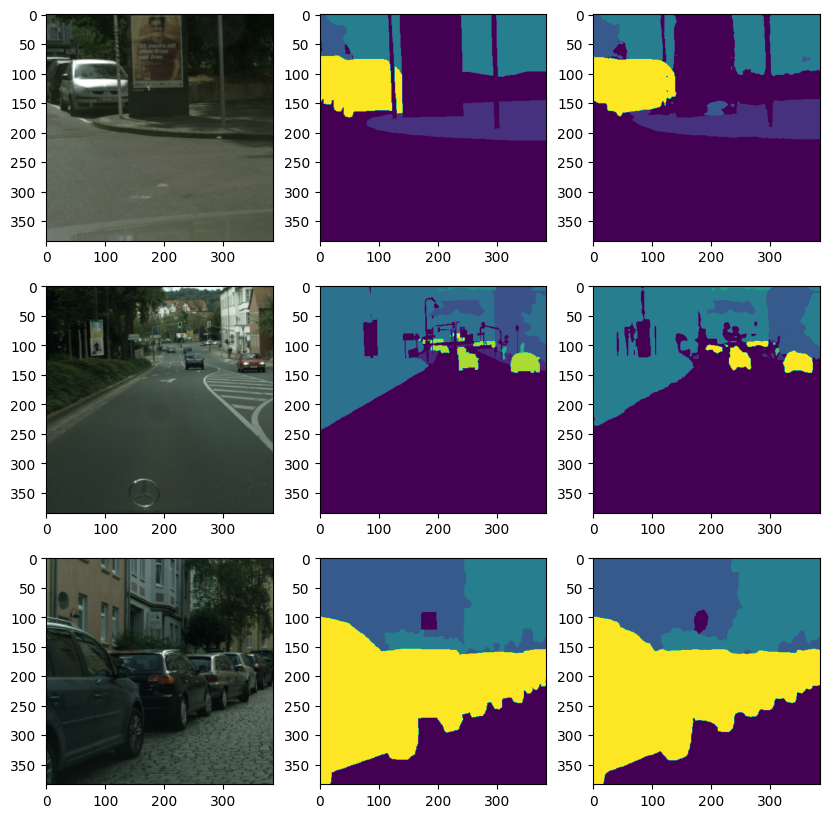

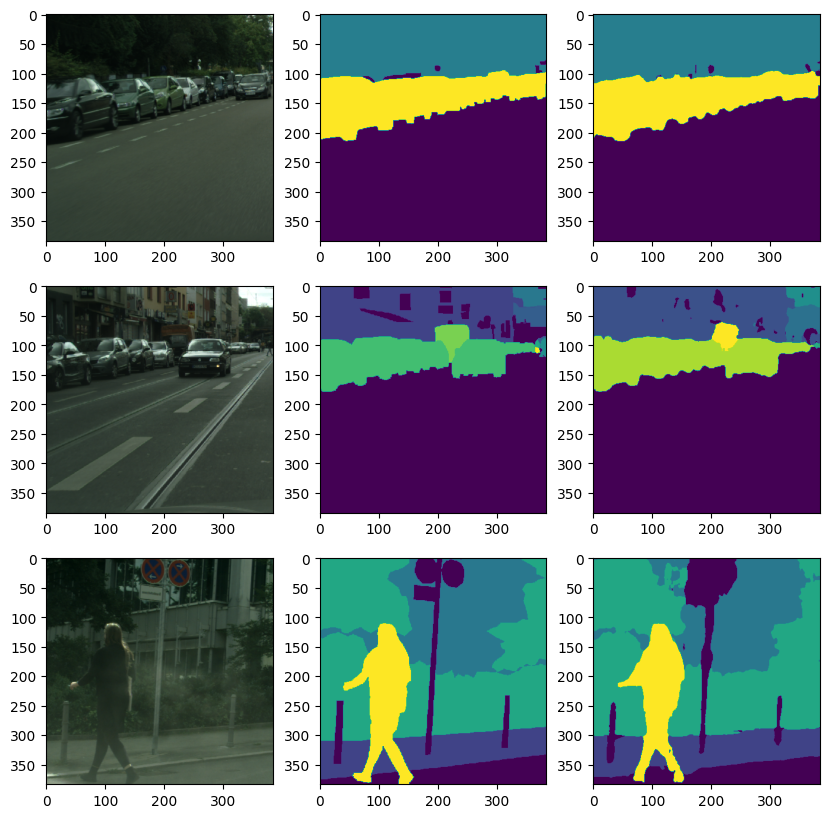

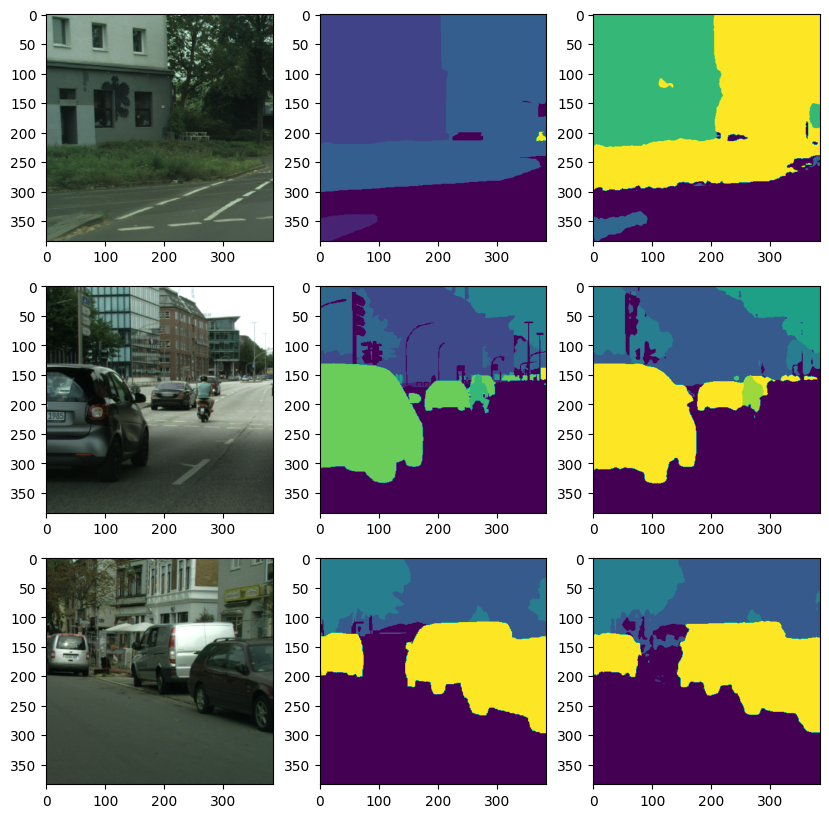

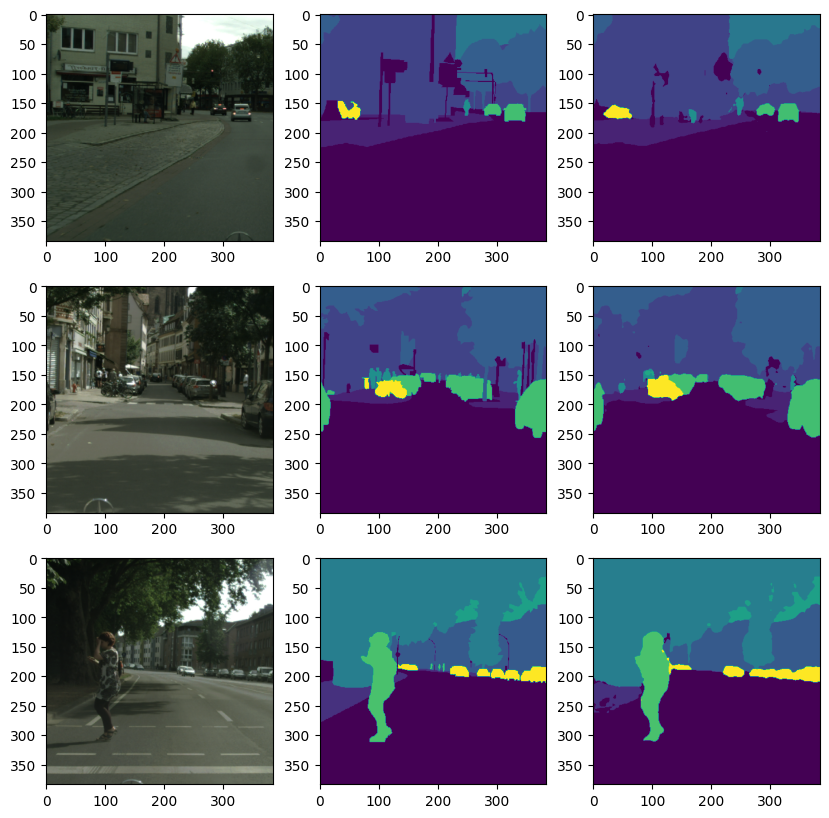

In [15]:
num = 3
for image, mask in dataset_train.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

    plt.figure(figsize=(10, 10))
    for i in range(num):
        plt.subplot(num, 3, i*num+1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        plt.subplot(num, 3, i*num+2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        plt.subplot(num, 3, i*num+3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

1/1 [==============================] - 0s 133ms/step
Mean IoU:  0.7536636
Accuracy:  0.93168914
Precision:  0.94709384
Recall:  0.96525997


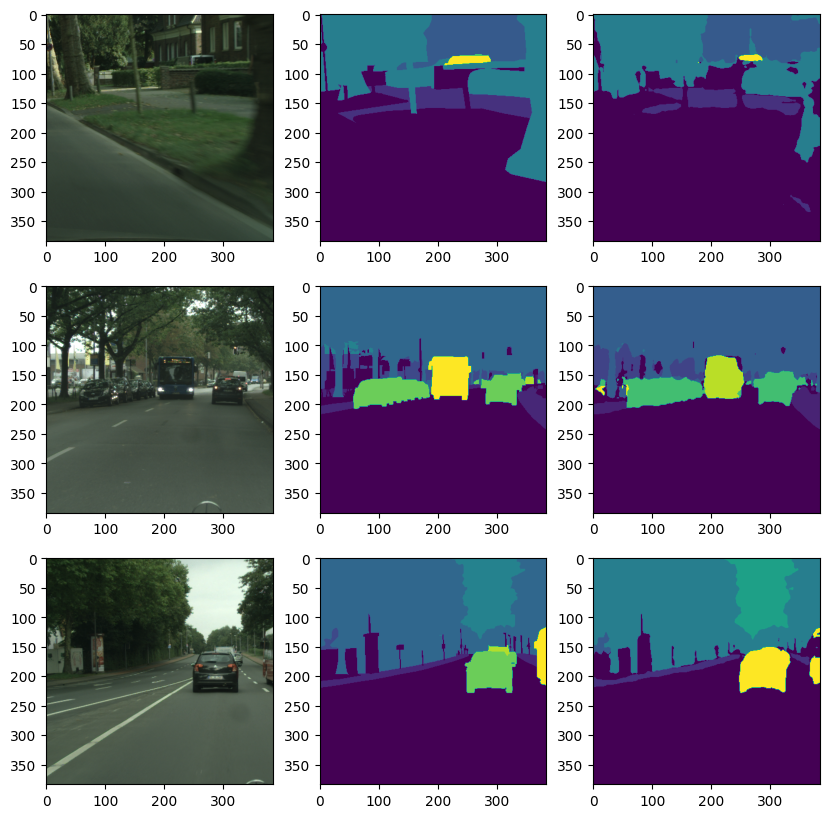

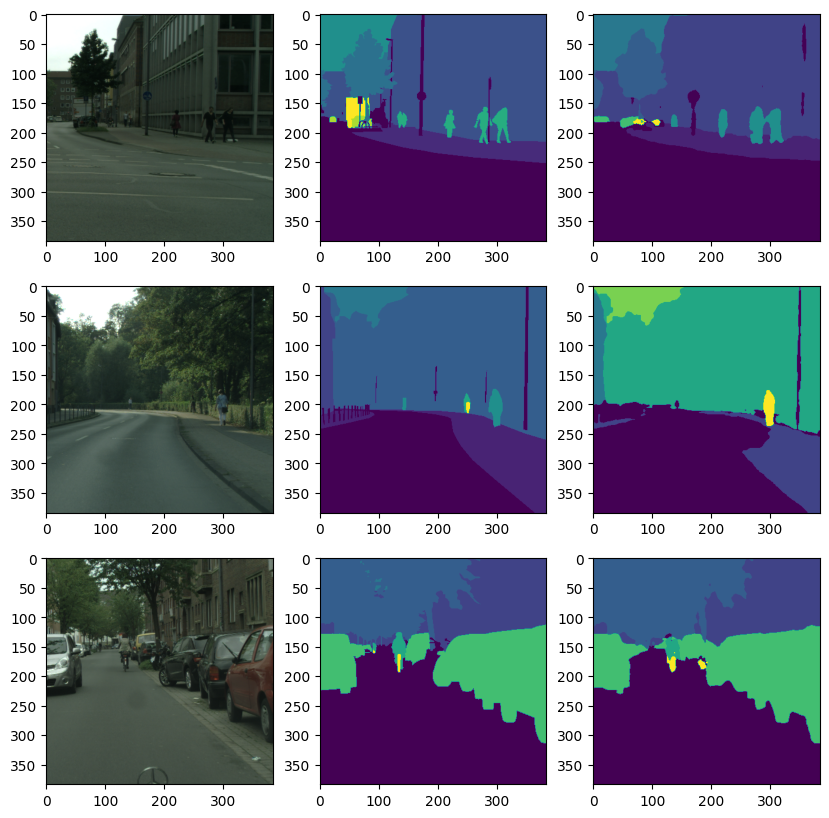

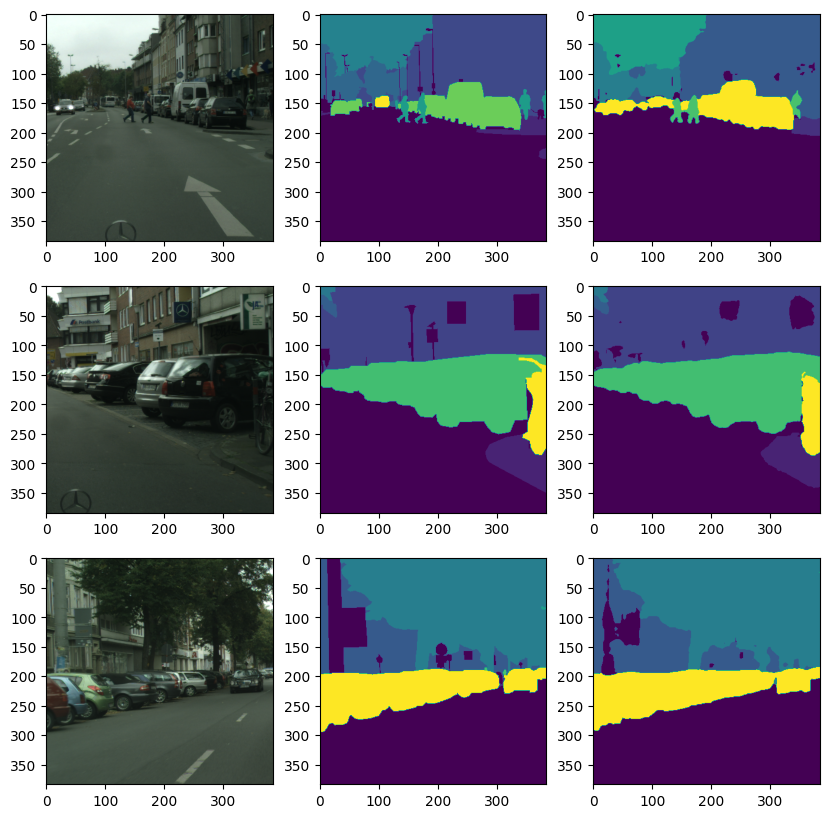

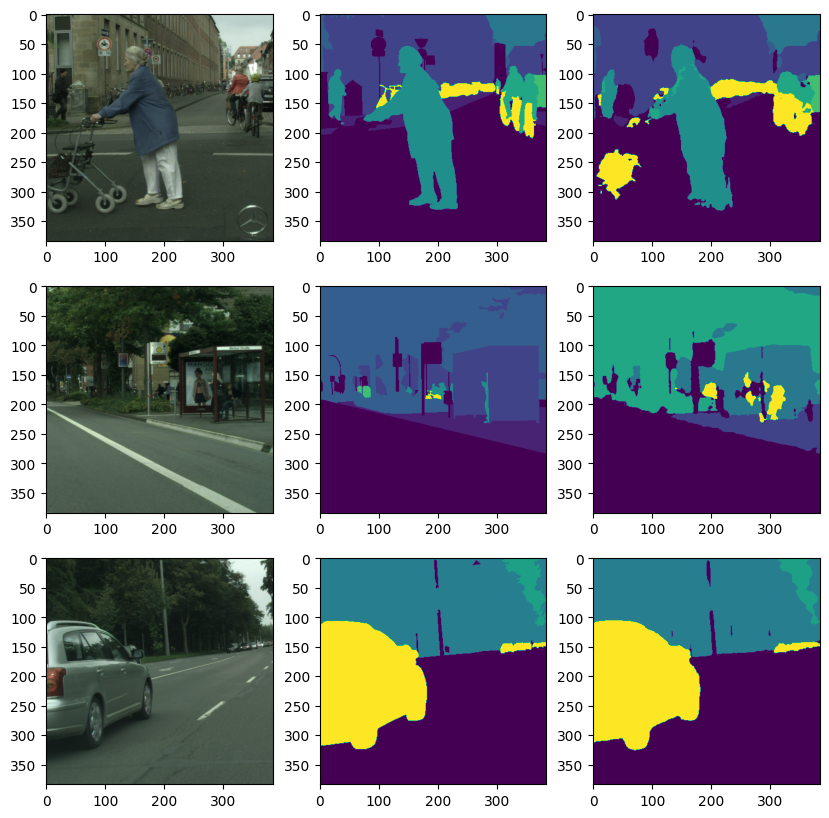

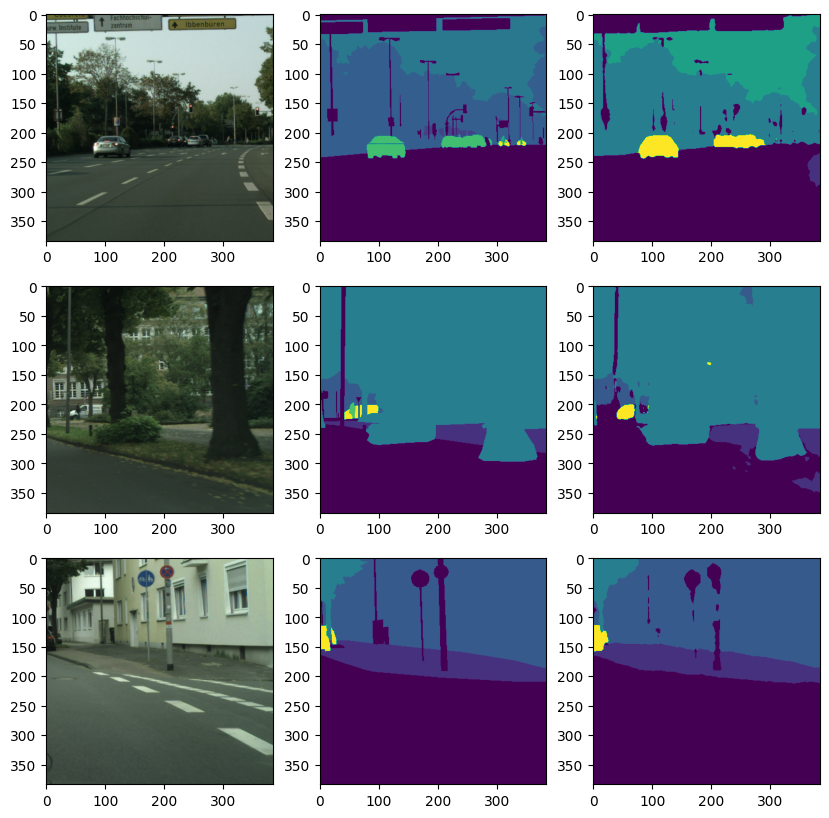

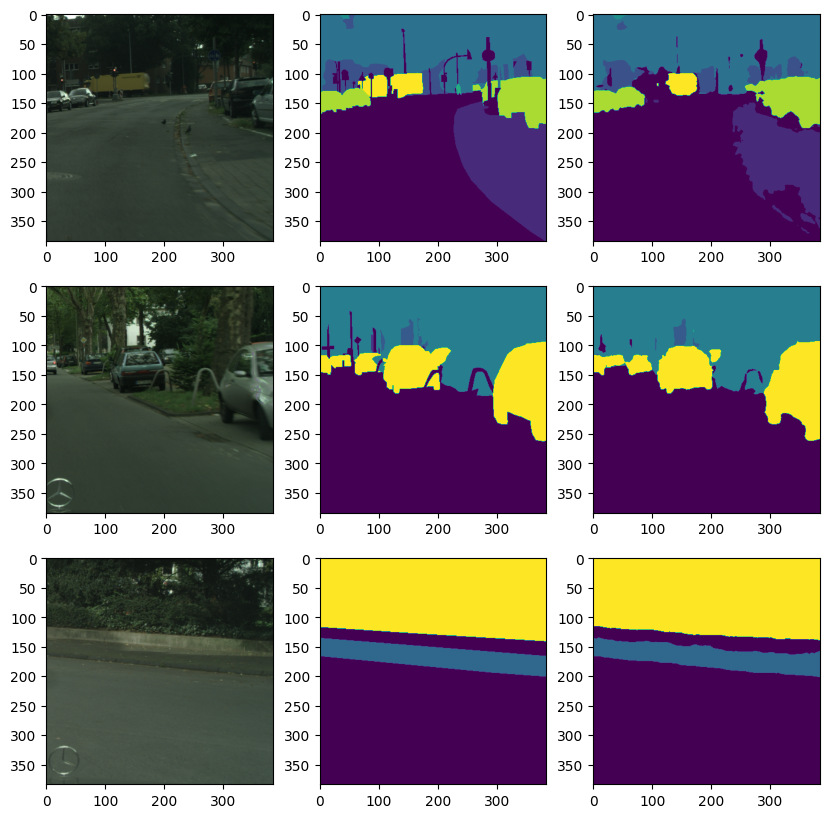

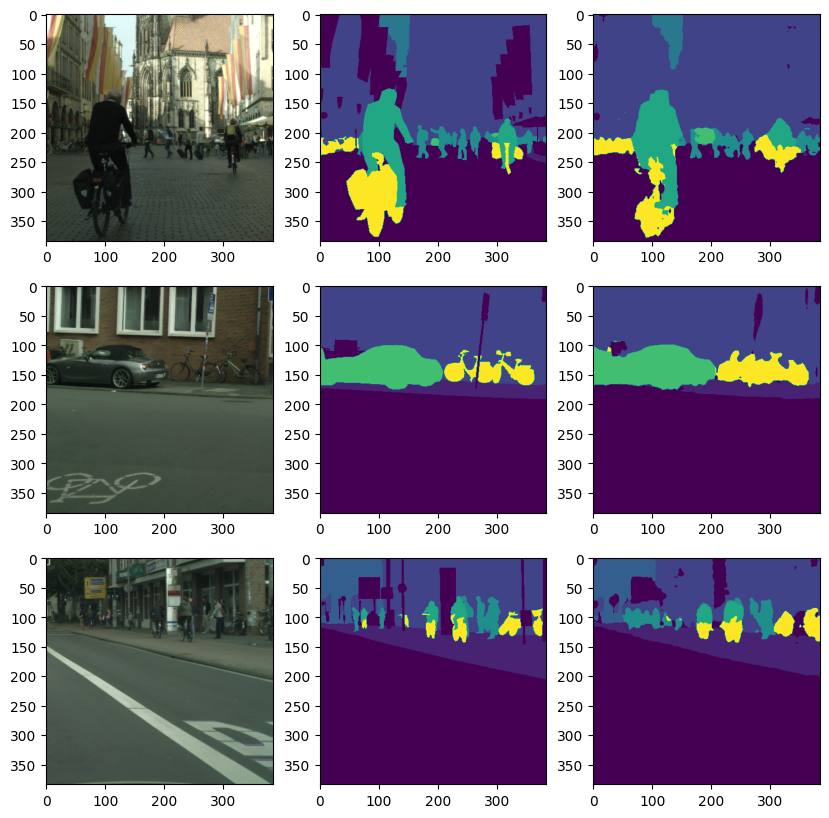

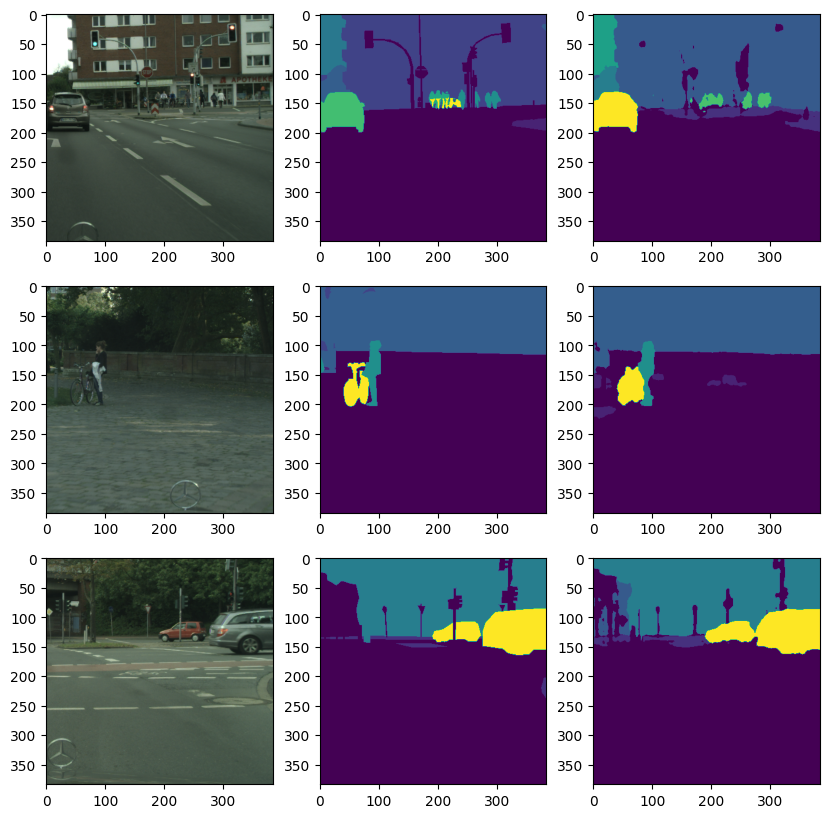

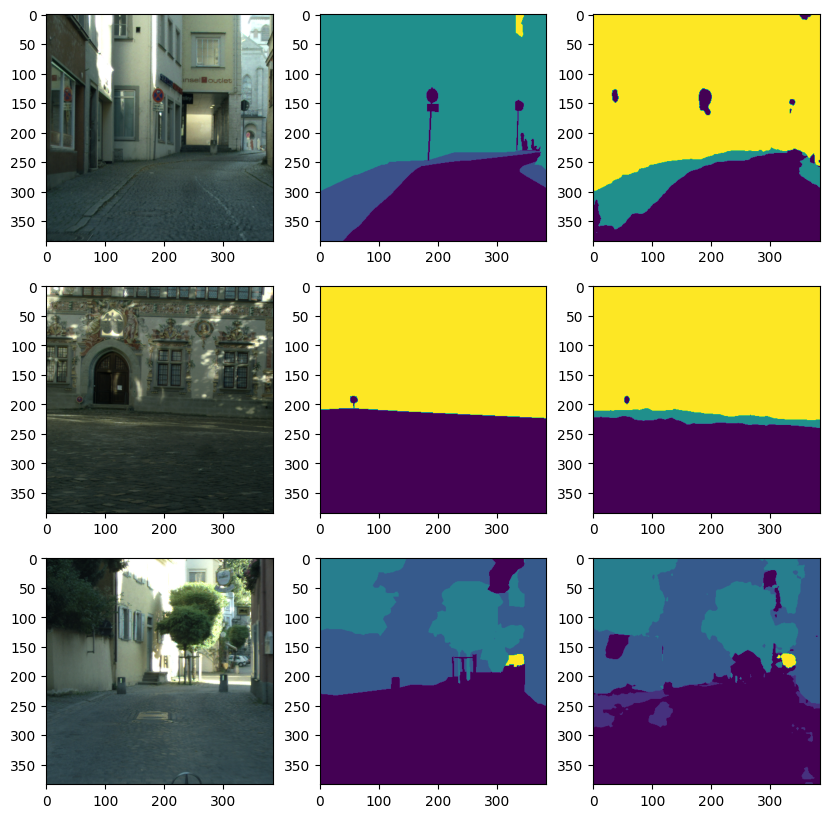

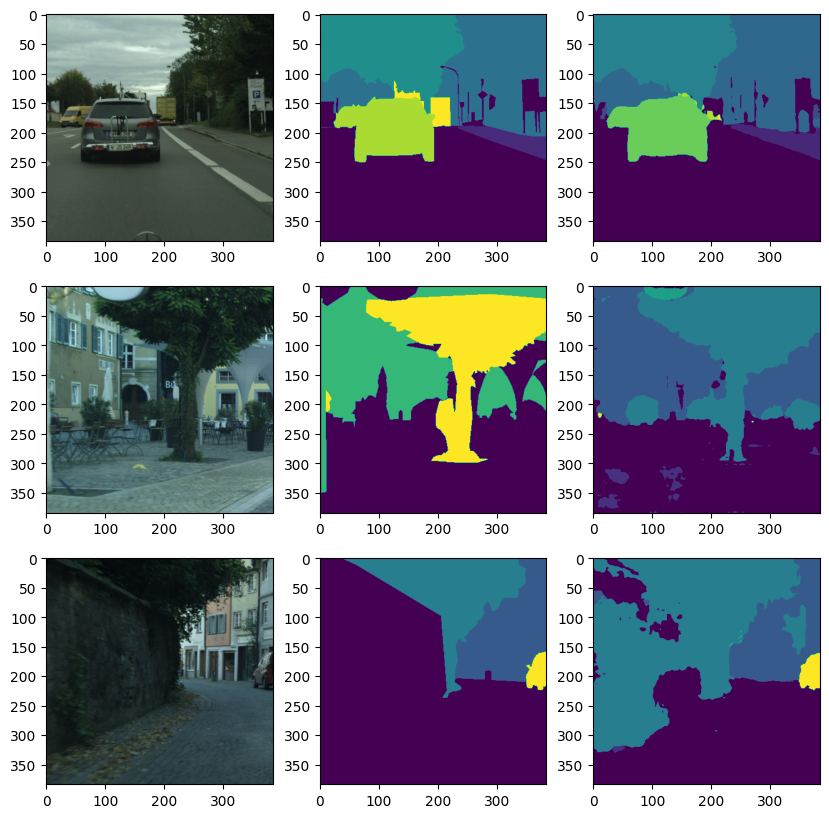

In [16]:
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

miou_metric = MeanIoU(num_classes=11)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

model.load_weights('path_to_my_weights.h5')

num = 3
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

    plt.figure(figsize=(10, 10))
    for i in range(num):
        plt.subplot(num, 3, i*num+1)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(image[i]))
        plt.subplot(num, 3, i*num+2)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(mask[i]))
        plt.subplot(num, 3, i*num+3)
        plt.imshow(tf.keras.preprocessing.image.array_to_img(pred_mask[i]))

miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()

print("Mean IoU: ", miou)
print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.metrics import MeanIoU, Accuracy, Precision, Recall

# 加载模型权重
model.load_weights('path_to_my_weights.h5')

# 初始化指标
num_classes = 11
miou_metric = MeanIoU(num_classes=num_classes)
accuracy_metric = Accuracy()
precision_metric = Precision()
recall_metric = Recall()

# 遍历数据集
for image, mask in dataset_val.take(10):
    pred_mask = model.predict(image)
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    miou_metric.update_state(mask, pred_mask)
    accuracy_metric.update_state(mask, pred_mask)
    precision_metric.update_state(mask, pred_mask)
    recall_metric.update_state(mask, pred_mask)

# 计算指标
miou = miou_metric.result().numpy()
accuracy = accuracy_metric.result().numpy()
precision = precision_metric.result().numpy()
recall = recall_metric.result().numpy()

# 获取每个类别的IoU
per_class_iou = miou_metric.get_weights()[0]

# 确保Class IDs和IoU值都是1维的
class_ids = list(range(num_classes))  # 将Class ID转换为列表确保是1维的

# 创建一个Pandas DataFrame来存储每个类别的IoU
metrics_df = pd.DataFrame({
    'Class ID': class_ids + ['Overall'],
    'IoU': list(per_class_iou) + [miou],  # 将per_class_iou转换为列表并添加miou
})

# 打印指标
print(metrics_df)
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")


1/1 [==============================] - 0s 150ms/step
   Class ID                                                IoU
0         0  [15894452.0, 244685.0, 394210.0, 282499.0, 111...
1         1  [252869.0, 1079248.0, 7193.0, 4744.0, 0.0, 341...
2         2  [180346.0, 14749.0, 5707033.0, 190946.0, 11551...
3         3  [154151.0, 11663.0, 140214.0, 6304423.0, 17410...
4         4  [3221.0, 0.0, 9726.0, 17289.0, 758454.0, 0.0, ...
5         5  [19854.0, 2322.0, 15000.0, 5902.0, 0.0, 210721...
6         6  [3963.0, 74.0, 3150.0, 2729.0, 0.0, 16824.0, 6...
7         7  [52459.0, 1233.0, 12763.0, 12280.0, 0.0, 1697....
8         8  [28102.0, 11.0, 8584.0, 2039.0, 257.0, 729.0, ...
9         9  [4161.0, 2.0, 2299.0, 1307.0, 0.0, 80.0, 160.0...
10       10  [20803.0, 3079.0, 8344.0, 5055.0, 0.0, 6848.0,...
11  Overall                                           0.745529
Accuracy: 0.9278098940849304
Precision: 0.9428181648254395
Recall: 0.9609189033508301


In [11]:
import numpy as np
import pandas as pd

# 假设已经完成了上述过程，并且miou_metric是最后的MeanIoU对象

# 获取混淆矩阵
confusion_matrix = miou_metric.get_weights()[0]

# 计算每个类别的IoU
ious = []
for i in range(num_classes):
    # 真正阳性（true positive，TP）
    tp = confusion_matrix[i, i]
    # 假正阳性（false positive，FP）和假负阳性（false negative，FN）
    fp = np.sum(confusion_matrix[:, i]) - tp
    fn = np.sum(confusion_matrix[i, :]) - tp
    # 真负阳性（true negative，TN）不用于IoU的计算
    
    iou = tp / (tp + fp + fn + 1e-7)  # 添加一个小数避免除以零
    ious.append(iou)

# 创建一个Pandas DataFrame来显示每个类别的IoU
metrics_df = pd.DataFrame({'Class ID': range(num_classes), 'IoU': ious})

# 计算并添加整体mIoU
miou = np.mean(ious)
metrics_df.loc[num_classes] = ['Overall', miou]

# 打印整体指标
print(metrics_df)
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")


   Class ID       IoU
0         0  0.898602
1         1  0.657819
2         2  0.843371
3         3  0.877807
4         4  0.914681
5         5  0.593042
6         6  0.455999
7         7  0.900381
8         8  0.588261
9         9  0.833843
10       10  0.637012
11  Overall  0.745529
Accuracy: 0.9278098940849304
Precision: 0.9428181648254395
Recall: 0.9609189033508301


In [19]:
import numpy as np
from sklearn.metrics import confusion_matrix

def pixel_accuracy(confusion_matrix):
    correct_pixels = np.diag(confusion_matrix).sum()
    total_pixels = confusion_matrix.sum()
    return correct_pixels / total_pixels

def class_wise_pixel_accuracy(confusion_matrix):
    class_accuracies = np.diag(confusion_matrix) / confusion_matrix.sum(axis=1)
    return np.nanmean(class_accuracies)

def mean_pixel_accuracy(confusion_matrix):
    return np.diag(confusion_matrix).sum() / confusion_matrix.sum()

def dice_coefficient(confusion_matrix):
    true_positives = np.diag(confusion_matrix)
    false_negatives = np.sum(confusion_matrix, axis=1) - true_positives
    false_positives = np.sum(confusion_matrix, axis=0) - true_positives
    dice = 2 * true_positives / (2 * true_positives + false_positives + false_negatives)
    return np.nanmean(dice)

# 初始化列表以存储真实标签和预测掩码
y_true_list = []
y_pred_list = []

# 遍历验证集，并获取预测结果
for image, mask in dataset_val:
    # 预测
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    # 将真实标签和预测掩码添加到列表中
    y_true_list.extend(np.asarray(mask).flatten())
    y_pred_list.extend(pred_mask.flatten())

# 计算混淆矩阵
num_classes = 11  # 类别数量
cm = confusion_matrix(y_true_list, y_pred_list, labels=range(num_classes))

# 计算各种指标
pa = pixel_accuracy(cm)
cpa = class_wise_pixel_accuracy(cm)
mpa = mean_pixel_accuracy(cm)
dice = dice_coefficient(cm)

print("Pixel Accuracy (PA):", pa)
print("Class-wise Pixel Accuracy (CPA):", cpa)
print("Mean Pixel Accuracy (MPA):", mpa)
print("Dice Coefficient:", dice)



1/1 [==============================] - 0s 130ms/step
Pixel Accuracy (PA): 0.9232926161024305
Class-wise Pixel Accuracy (CPA): 0.8050741831174739
Mean Pixel Accuracy (MPA): 0.9232926161024305
Dice Coefficient: 0.8128394735196455


In [20]:
import numpy as np
from sklearn.metrics import cohen_kappa_score, jaccard_score

# 计算Kappa系数
y_true_list = []
y_pred_list = []

for image, mask in dataset_val:
    pred_mask = model.predict(image)
    pred_mask = np.argmax(pred_mask, axis=-1)
    
    mask = mask.numpy().flatten()
    pred_mask = pred_mask.flatten()
    
    y_true_list.extend(mask)
    y_pred_list.extend(pred_mask)

kappa = cohen_kappa_score(y_true_list, y_pred_list)

# 计算Jaccard相似性系数
jaccard = jaccard_score(y_true_list, y_pred_list, average='macro')

# 计算频权交并比
def frequency_weighted_intersection_over_union(y_true, y_pred):
    intersection = np.histogram2d(y_true, y_pred, bins=(num_classes, num_classes))[0]
    ground_truth_frequency = np.histogram(y_true, bins=num_classes)[0]
    predicted_frequency = np.histogram(y_pred, bins=num_classes)[0]
    union = np.outer(ground_truth_frequency, predicted_frequency)
    union = np.maximum(union, 1)
    iou = intersection / union
    weighted_iou = iou * (ground_truth_frequency / len(y_true))
    frequency_weighted_iou = weighted_iou.sum()
    return frequency_weighted_iou

fw_iou = frequency_weighted_intersection_over_union(y_true_list, y_pred_list)

print("Kappa Score:", kappa)
print("Jaccard Similarity Score:", jaccard)
print("Frequency Weighted Intersection over Union:", fw_iou)


1/1 [==============================] - 0s 130ms/step
Kappa Score: 0.8883928290462717
Jaccard Similarity Score: 0.7063161867824101
Frequency Weighted Intersection over Union: 1.500579533298294e-07


In [22]:
import tensorflow_model_optimization as tfmot

quantize_model = tfmot.quantization.keras.quantize_model


q_model = quantize_model(model)

# 编译量化模型
q_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 这里我们不需要重新训练模型，但需要通过代表性数据集运行模型以完成校准过程
q_model.fit(dataset_train, epochs=1, validation_data=dataset_val)

/environment/miniconda3/lib/python3.10/site-packages/tensorflow_model_optimization/python/core/quantization/keras/quantize.py:213: UserWarning: Lambda layers are not supported by automatic model annotation because the internal functionality cannot always be determined by serialization alone. We recommend that you make a custom layer and add a custom QuantizeConfig for it instead. This layer will not be quantized which may lead to unexpected results.
  warnings.warn(


AttributeError: Exception encountered when calling layer "tf.__operators__.add" (type TFOpLambda).

'list' object has no attribute 'dtype'

Call arguments received by layer "tf.__operators__.add" (type TFOpLambda):
  • x=['tf.Tensor(shape=(None, 576, 640), dtype=float32)']
  • y=tf.Tensor(shape=(None, 576, 640), dtype=float32)
  • name=None

In [ ]:
q_model.save('path_to_save_quantized_model')